In [31]:
import sys
sys.path.append('/orange/adamginsburg/ALMA_IMF/reduction/analysis')
from spectralindex import prefixes
from astropy.visualization import simple_norm
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from mpl_toolkits.axes_grid1.inset_locator import TransformedBbox, BboxPatch, BboxConnector
import astropy.visualization.wcsaxes
from spectral_cube import SpectralCube

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
%matplotlib inline
import pylab as pl

In [ ]:
os.chdir('/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/February2021Release/')

In [ ]:
prefixes['W43MM1'] = dict(
    finaliter_prefix_b3="W43-MM1/B3/cleanest/W43-MM1_B3_uid___A001_X1296_X1af_continuum_merged_12M_robust0_selfcal4_finaliter",
    finaliter_prefix_b6="W43-MM2/B6/cleanest/W43-MM2_B6_uid___A001_X1296_X113_continuum_merged_12M_robust0_selfcal5_finaliter",)

In [ ]:
prefixes.keys()

dict_keys(['G328', 'G333', 'G12', 'W51IRS2', 'G008', 'G327', 'G10', 'G337', 'G338', 'G351', 'G353', 'W43MM3', 'W43MM2', 'W43MM1', 'W51-E'])

In [68]:
def make_zoom(fieldid, zoom_parameters,
              overview_vis_pars={'max_percent':99.5, 'min_percent':0.5, 'stretch':'linear'},
              overview_cmap='gray_r',
              inset_cmap='inferno',
              band='B6',
              main_zoombox=None,
              fig=None,
              ax=None,
              save=True,
              zorder=None,
             ):
    
    pfxs = prefixes[fieldid]

    finaliter_prefix = pfxs[f'finaliter_prefix_{band}'.lower()]
    image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

    if fig is None:
        fig = pl.figure(1, figsize=(10,10))
        fig.clf()
    if ax is None:
        ax = fig.add_subplot(projection=image.wcs.celestial)

    img = image[0].value
    norm = simple_norm(img, **overview_vis_pars)
    im = ax.imshow(img, cmap=overview_cmap, norm=norm, zorder=zorder)
    print(' im zorder', im.get_zorder())

    tick_fontsize=16
    ra = ax.coords['ra']
    ra.set_major_formatter('hh:mm:ss.s')
    dec = ax.coords['dec']
    ra.set_axislabel("RA (J2000)", fontsize=20)
    dec.set_axislabel("Dec (J2000)", fontsize=20, minpad=0.0)
    ra.ticklabels.set_fontsize(tick_fontsize)
    ra.set_ticks(exclude_overlapping=True)
    dec.ticklabels.set_fontsize(tick_fontsize)
    dec.set_ticks(exclude_overlapping=True)

    for zp in zoom_parameters:

        xl,xr = zp['xl'], zp['xr']
        yl,yu = zp['yl'], zp['yu']
        slc = (slice(yl,yu), slice(xl,xr))
        axins = inset_axes(ax, **zp['inset_pars'],
                           axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                           axes_kwargs=dict(wcs=image[0][slc].wcs.celestial))

        norm2 = simple_norm(img, **zp['vis_pars'])

        im = axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap=inset_cmap, norm=norm2)
        pp, p1, p2 = mark_inset(parent_axes=ax, inset_axes=axins,
                   fc="none", ec="b", **zp['mark_inset_pars'])
        if 'zorder' in zp['mark_inset_pars']:
            pp.set_zorder(zp['mark_inset_pars']['zorder']+1)
            p1.set_zorder(zp['mark_inset_pars']['zorder']+1)
            p2.set_zorder(zp['mark_inset_pars']['zorder']+1)
        ra = axins.coords['ra']
        dec = axins.coords['dec']
        axins.set_xticklabels([])
        axins.set_yticklabels([])
        axins.xaxis.set_visible(False)
        axins.yaxis.set_visible(False)
        ra.set_ticks_visible(False)
        dec.set_ticks_visible(False)
        ra.set_axislabel('')
        dec.set_axislabel('')
        ra.ticklabels.set_visible(False)
        dec.ticklabels.set_visible(False)
        
    #print(ax.axis())
    if main_zoombox:
        ax.axis(main_zoombox)

    if save:
        pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_{band}.png', bbox_inches='tight')
        pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_{band}.pdf', bbox_inches='tight')

In [ ]:
zoom_parameters = {}

 im zorder 0


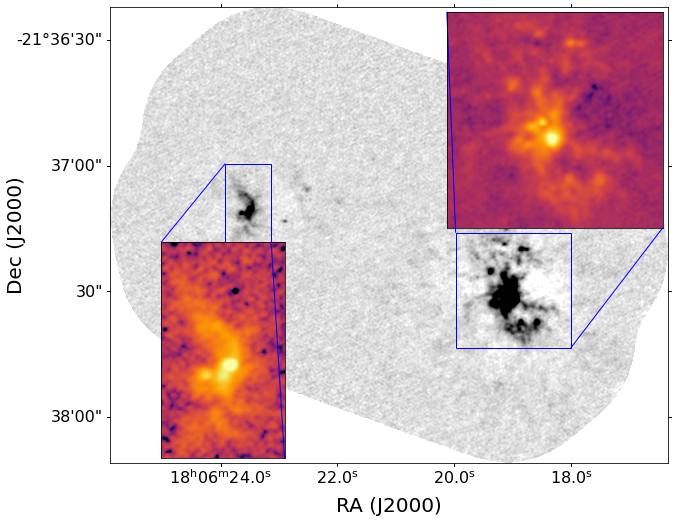

In [ ]:
zoom_parameters[('G008', 'B6')] = [{'xl':750, 'xr':1000, 'yl':250, 'yu':500, 
                                    'inset_pars':{'loc': 1, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0, 'stretch':'log'}
                                   },
                                   {'xl':250, 'xr':350, 'yl':475, 'yu':650, 
                                    'inset_pars':{'loc': 3, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.9, 'min_percent': 2, 'stretch':'log'}
                                   },
                                  ]
make_zoom('G008', zoom_parameters[('G008', 'B6')], band='B6')

 im zorder 0


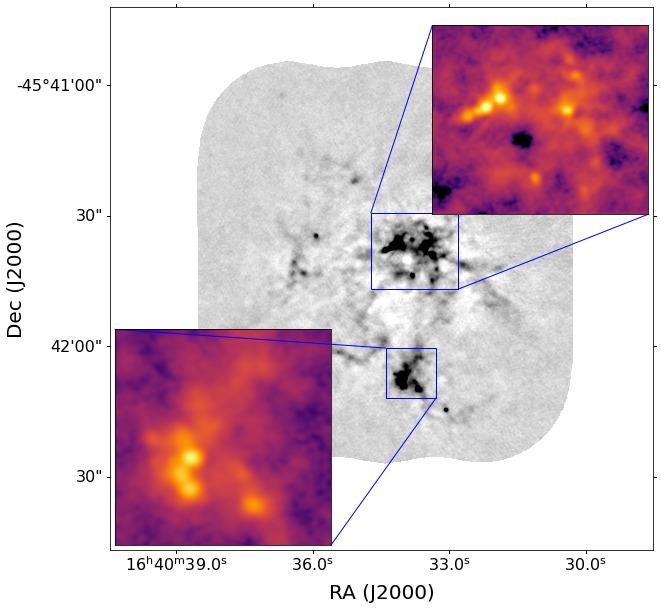

In [ ]:
zoom_parameters[('G338', 'B6')] = [{'xl':400, 'xr':600, 'yl':400, 'yu':575, 
                                    'inset_pars':{'loc': 1, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   {'xl':435, 'xr':550, 'yl':150, 'yu':265, 
                                    'inset_pars':{'loc': 3, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 1, 'stretch':'log'}
                                   },
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom('G338', zoom_parameters[('G338', 'B6')], band='B6', main_zoombox=(-200,1050,-200,1050))

 im zorder 0


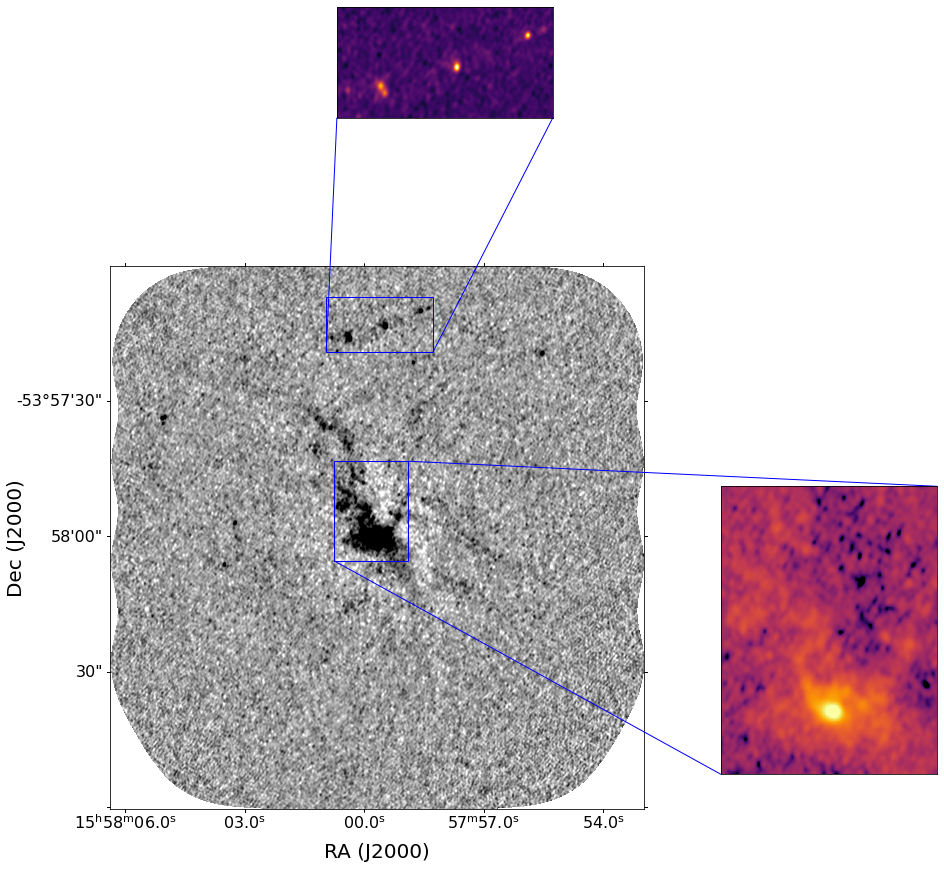

In [ ]:
zoom_parameters[('G328', 'B6')] = [{'xl':450, 'xr':600, 'yl':500, 'yu':700, 
                                    'inset_pars':{'loc': 4, 'width':4, 'height':4, 'bbox_to_anchor':(870, 120, 100, 100),},
                                    'mark_inset_pars':{'loc1':1, 'loc2':3,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   {'xl':435, 'xr':650, 'yl':920, 'yu':1030, 
                                    'inset_pars':{'loc': 1, 'width':3, 'height':3, 'bbox_to_anchor':(450, 850, 100,100),},
                                    'mark_inset_pars':{'loc1':3, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.95, 'min_percent': 0, 'stretch':'linear'}
                                   },
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom('G328', zoom_parameters[('G328', 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


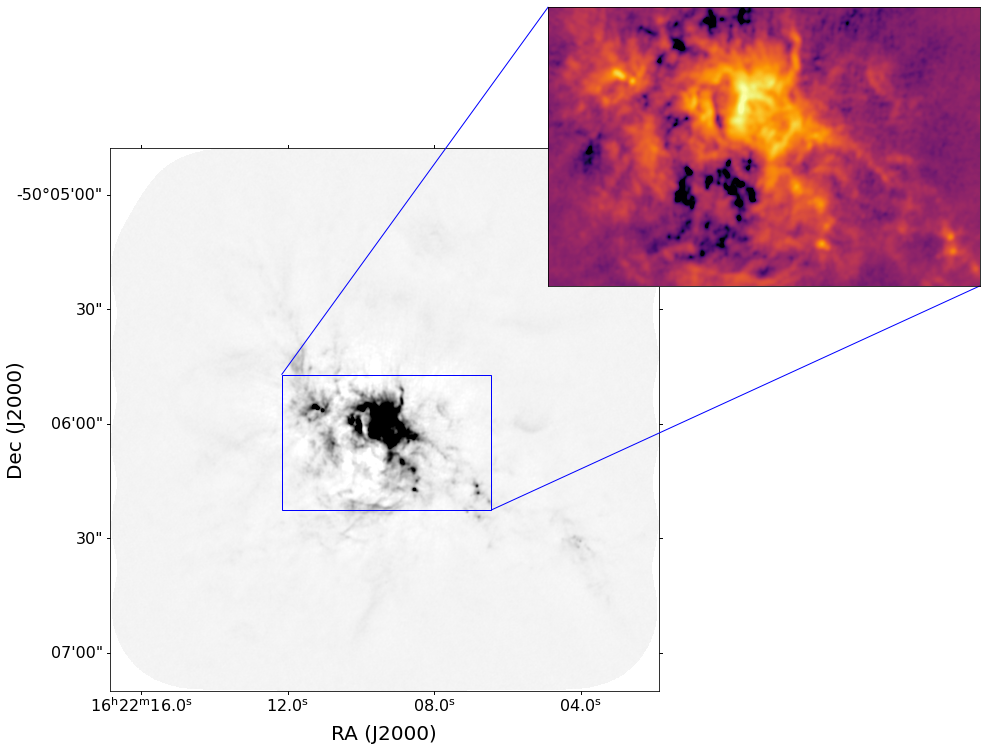

In [ ]:
zoom_parameters[('G333', 'B6')] = [{'xl':450, 'xr':1000, 'yl':475, 'yu':830, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(670, 120, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':435, 'xr':650, 'yl':920, 'yu':1030, 
                                   # 'inset_pars':{'loc': 1, 'width':3, 'height':3, 'bbox_to_anchor':(450, 850, 100,100),},
                                   # 'mark_inset_pars':{'loc1':3, 'loc2':4,},
                                   # 'vis_pars':{'max_percent':99.95, 'min_percent': 0, 'stretch':'linear'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom('G333', zoom_parameters[('G333', 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


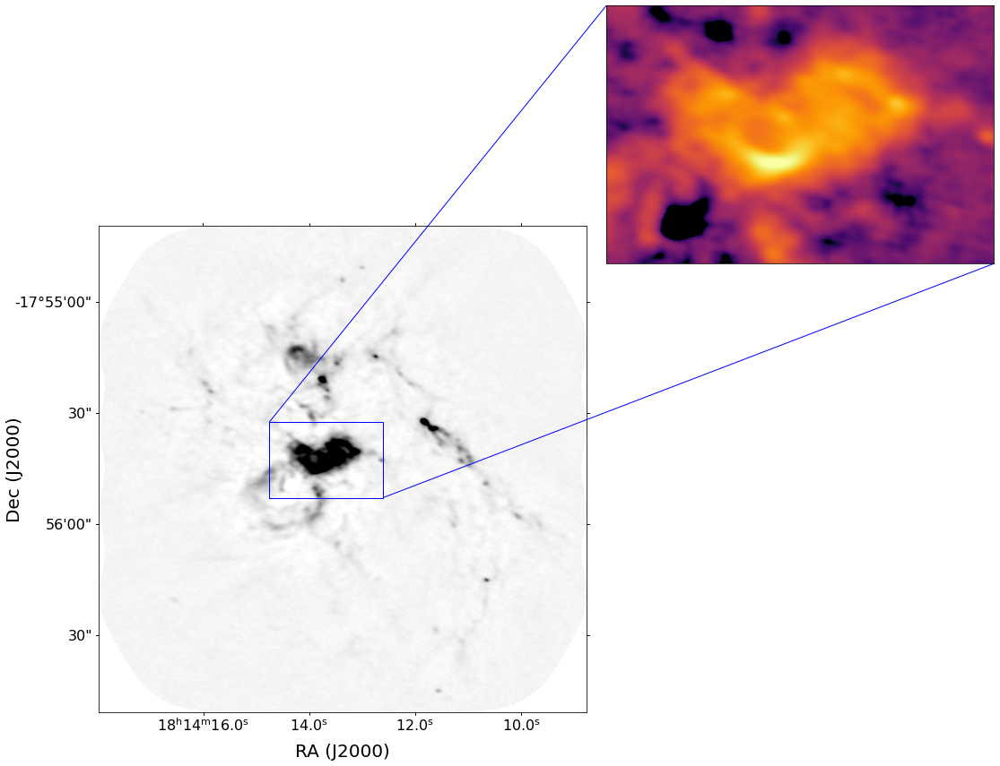

In [ ]:
zoom_parameters[('G12', 'B6')] = [{'xl':270, 'xr':450, 'yl':340, 'yu':460, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(800, 220, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':435, 'xr':650, 'yl':920, 'yu':1030, 
                                   # 'inset_pars':{'loc': 1, 'width':3, 'height':3, 'bbox_to_anchor':(450, 850, 100,100),},
                                   # 'mark_inset_pars':{'loc1':3, 'loc2':4,},
                                   # 'vis_pars':{'max_percent':99.95, 'min_percent': 0, 'stretch':'linear'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom('G12', zoom_parameters[('G12', 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


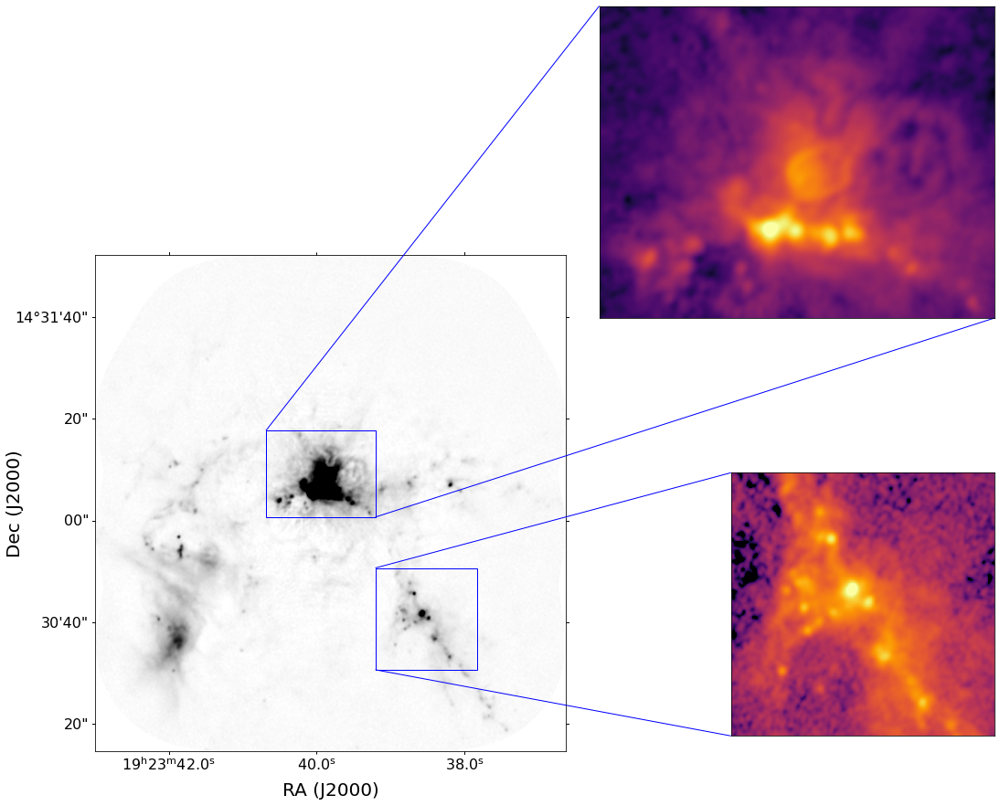

In [ ]:
zoom_parameters[('W51IRS2', 'B6')] = [{'xl':335, 'xr':550, 'yl':460, 'yu':630, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(800, 220, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   {'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                    'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                    'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   },
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom('W51IRS2', zoom_parameters[('W51IRS2', 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

In [ ]:
prefixes.keys()

dict_keys(['G328', 'G333', 'G12', 'W51IRS2', 'G008', 'G327', 'G10', 'G337', 'G338', 'G351', 'G353', 'W43MM3', 'W43MM2', 'W43MM1', 'W51-E'])

 im zorder 0


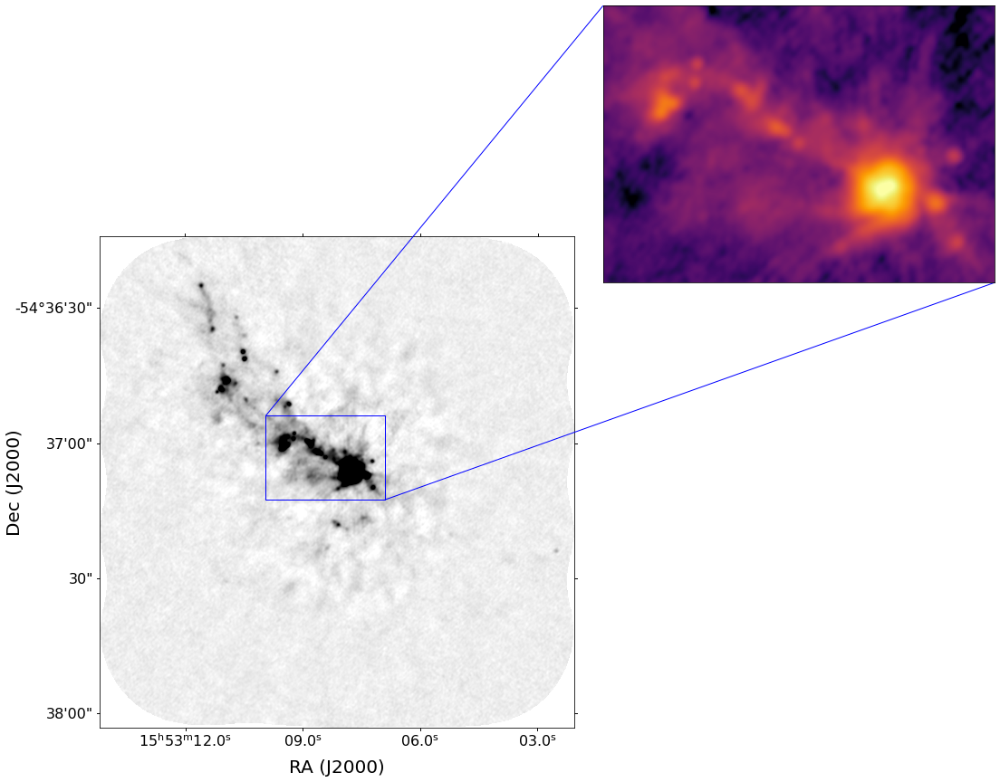

In [ ]:
zoom_parameters[('G327', 'B6')] = [{'xl':335, 'xr':575, 'yl':460, 'yu':630, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(800, 220, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                   # 'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                   # 'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                   # 'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom('G327', zoom_parameters[('G327', 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


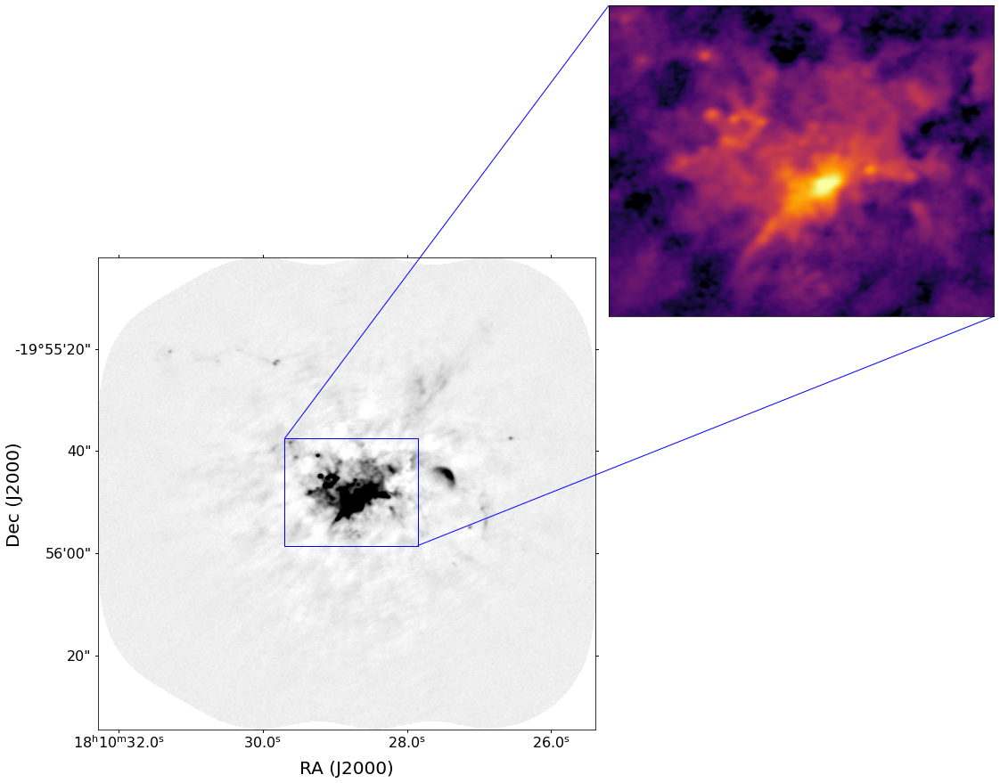

In [ ]:
fieldid='G10'
zoom_parameters[(fieldid, 'B6')] = [{'xl':365, 'xr':625, 'yl':360, 'yu':570, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(800, 220, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                   # 'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                   # 'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                   # 'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom(fieldid, zoom_parameters[(fieldid, 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


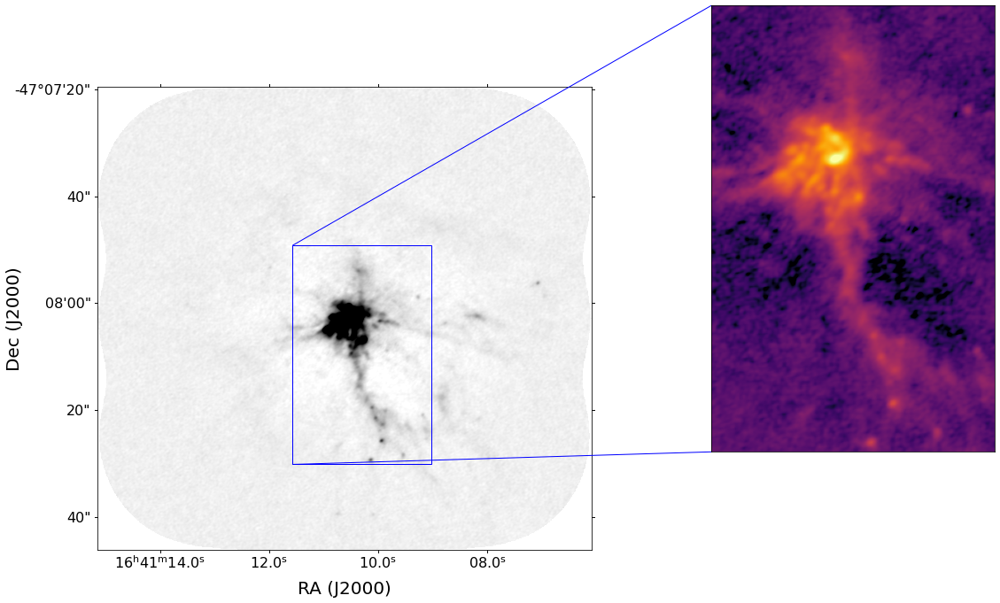

In [ ]:
fieldid='G337'
zoom_parameters[(fieldid, 'B6')] = [{'xl':365, 'xr':625, 'yl':160, 'yu':570, 
                                    'inset_pars':{'loc': 1, 'width':7, 'height':7, 'bbox_to_anchor':(600, 20, 600, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                   # 'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                   # 'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                   # 'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom(fieldid, zoom_parameters[(fieldid, 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


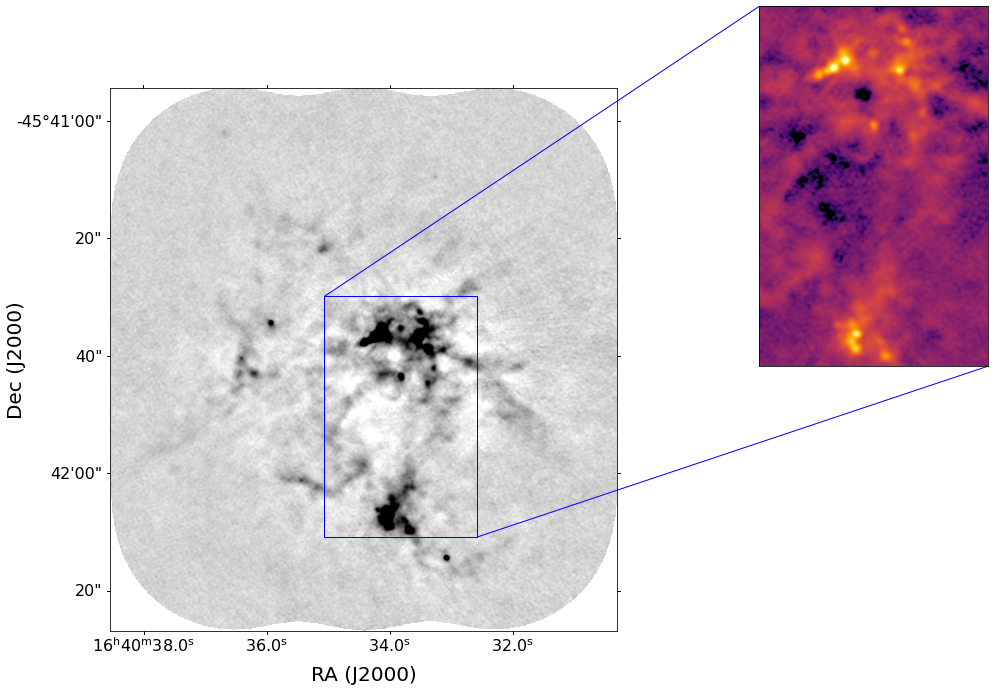

In [ ]:
fieldid='G338'
zoom_parameters[(fieldid, 'B6')] = [{'xl':365, 'xr':625, 'yl':160, 'yu':570, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(800, 20, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                   # 'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                   # 'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                   # 'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom(fieldid, zoom_parameters[(fieldid, 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


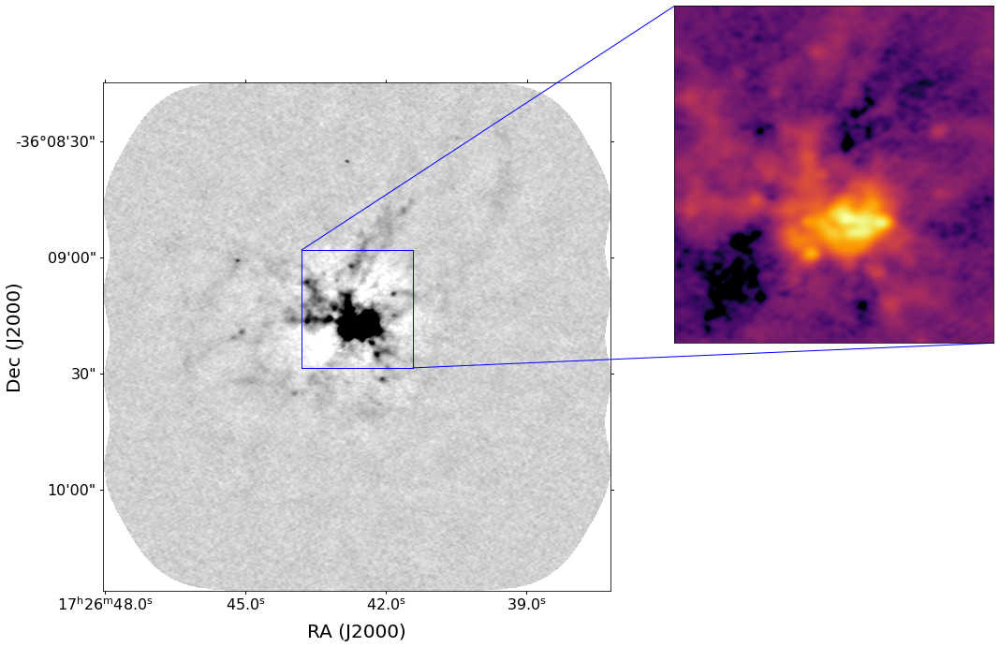

In [ ]:
fieldid='G351'
zoom_parameters[(fieldid, 'B6')] = [{'xl':320, 'xr':500, 'yl':360, 'yu':550, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(800, 20, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.999, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                   # 'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                   # 'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                   # 'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom(fieldid, zoom_parameters[(fieldid, 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


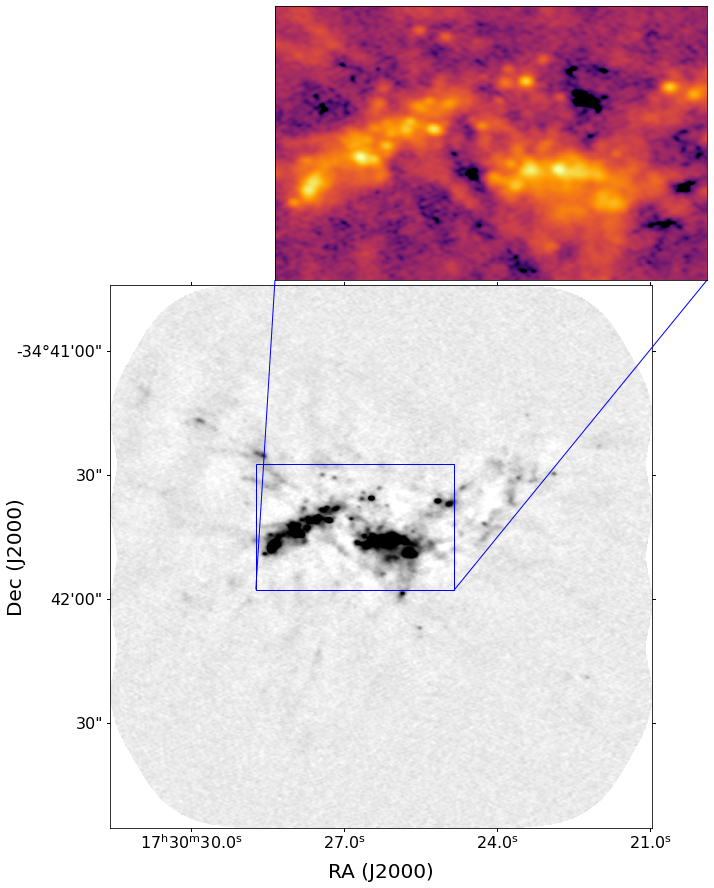

In [ ]:
fieldid='G353'
zoom_parameters[(fieldid, 'B6')] = [{'xl':220, 'xr':520, 'yl':360, 'yu':550, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(400, 260, 300, 700),},
                                    'mark_inset_pars':{'loc1':3, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.999, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                   # 'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                   # 'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                   # 'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom(fieldid, zoom_parameters[(fieldid, 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


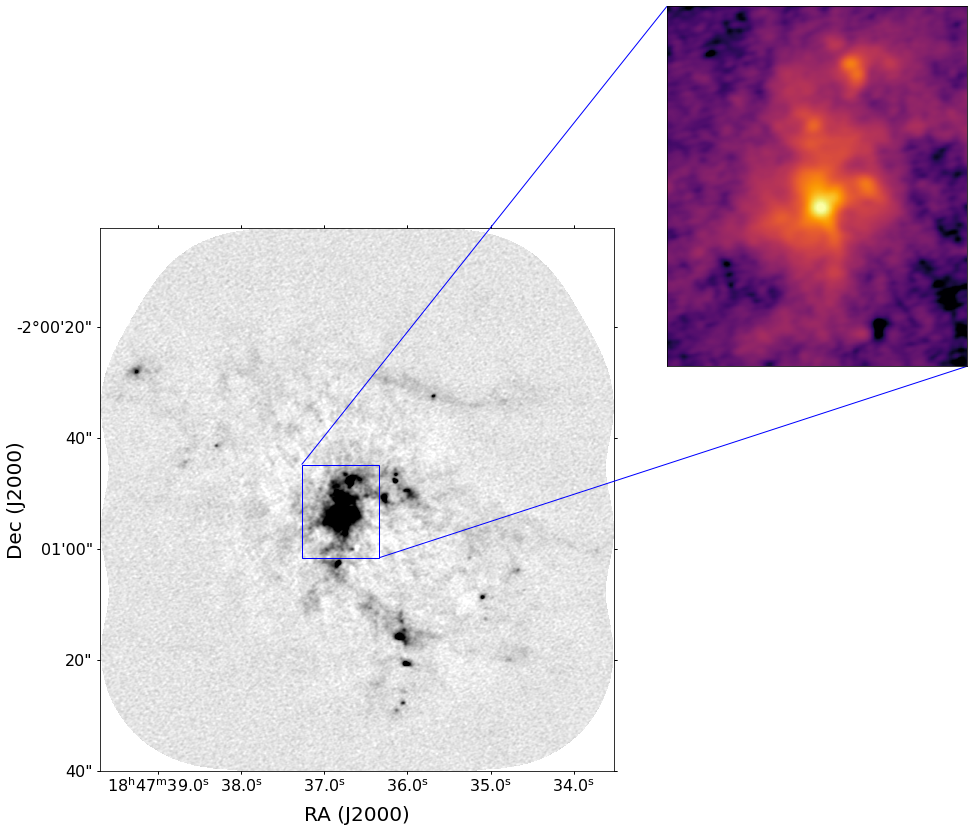

In [ ]:
fieldid='W43MM2'
zoom_parameters[(fieldid, 'B6')] = [{'xl':520, 'xr':720, 'yl':550, 'yu':790, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(750, 160, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.999, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                   # 'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                   # 'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                   # 'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom(fieldid, zoom_parameters[(fieldid, 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


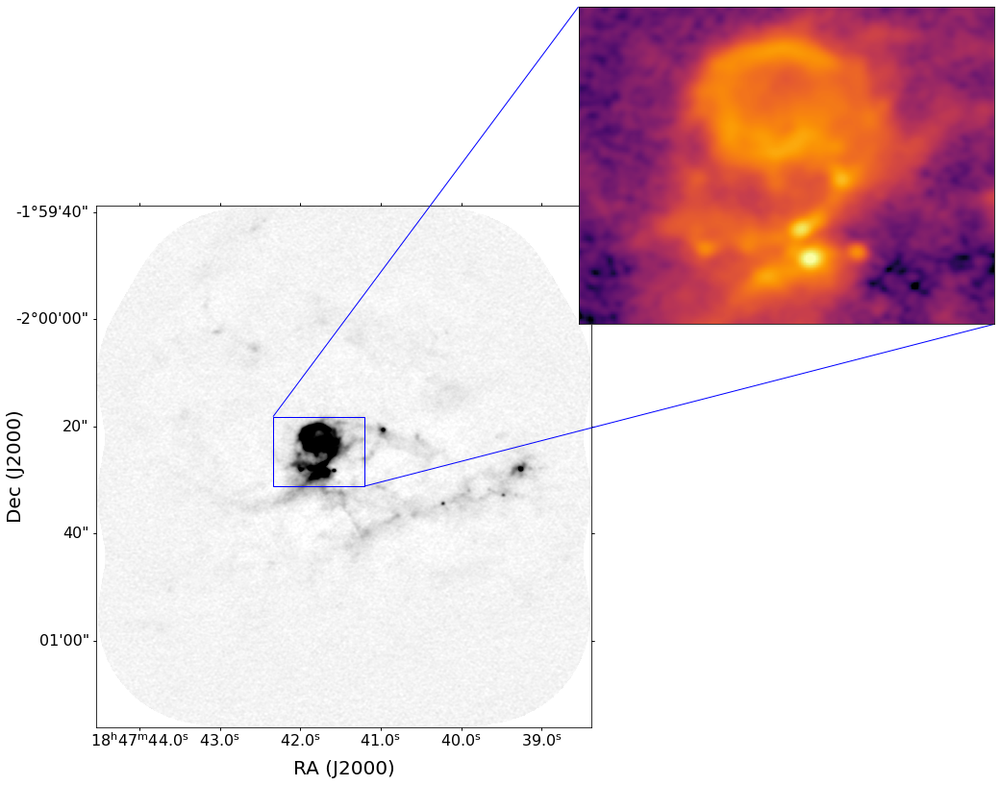

In [ ]:
fieldid='W43MM3'
zoom_parameters[(fieldid, 'B6')] = [{'xl':330, 'xr':500, 'yl':450, 'yu':580, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(750, 160, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.999, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                   # 'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                   # 'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                   # 'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom(fieldid, zoom_parameters[(fieldid, 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

 im zorder 0


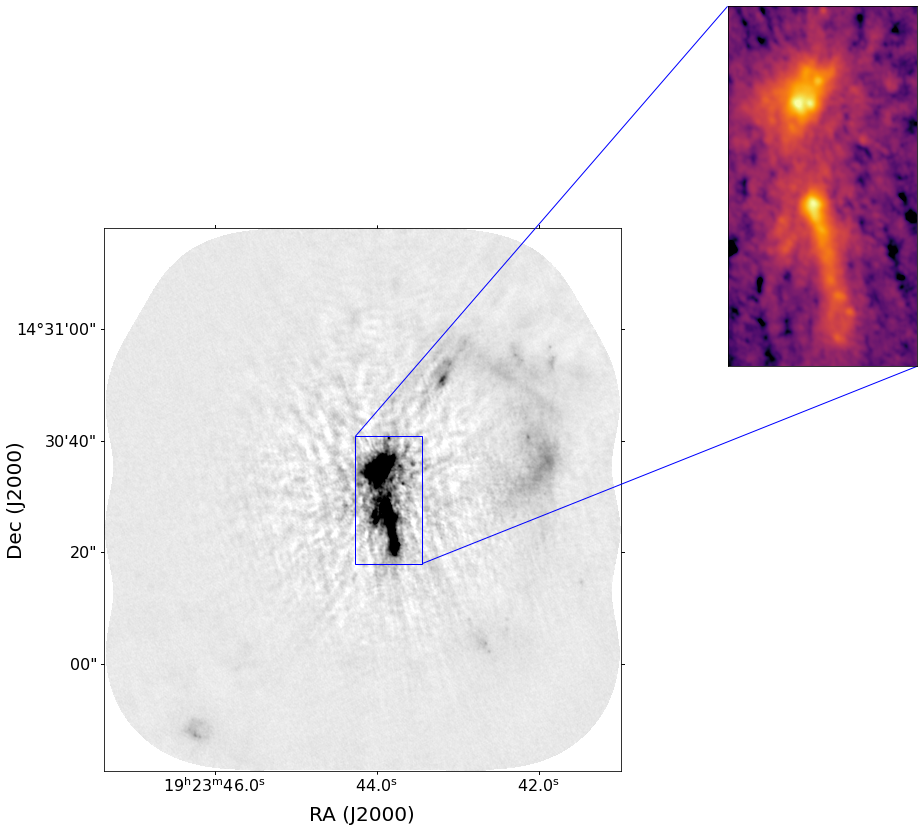

In [ ]:
fieldid='W51-E'
zoom_parameters[(fieldid, 'B6')] = [{'xl':750, 'xr':950, 'yl':620, 'yu':1000, 
                                    'inset_pars':{'loc': 1, 'width':6, 'height':5, 'bbox_to_anchor':(750, 160, 300, 700),},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.999, 'min_percent': 0.1, 'stretch':'log'}
                                   },
                                   #{'xl':550, 'xr':750, 'yl':160, 'yu':360, 
                                   # 'inset_pars':{'loc': 1, 'width':4, 'height':4, 'bbox_to_anchor':(1000, 300, 100,100),},
                                   # 'mark_inset_pars':{'loc1':2, 'loc2':3,},
                                   # 'vis_pars':{'max_percent':99.7, 'min_percent': 1, 'stretch':'log'}
                                   #},
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom(fieldid, zoom_parameters[(fieldid, 'B6')], band='B6',)# main_zoombox=(0,1600,0,1110))

# Make Global Zoom

Based on https://github.com/keflavich/SgrB2_ALMA_2015.1.00550.S/blob/master/analysis/ZoomInMatplotlibExample.ipynb

In [ ]:
from astropy import visualization
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np

In [ ]:
from astropy import coordinates, units as u
radec = coordinates.SkyCoord(0*u.deg, 0*u.deg, frame='fk5')

In [ ]:
from mpl_toolkits.axes_grid1.inset_locator import TransformedBbox, BboxPatch, BboxConnector, Path
from matplotlib.transforms import Bbox
from matplotlib.patches import Polygon, PathPatch, ConnectionPatch

def mark_inset_otherdata(axins, parent_ax, bl, tr, loc1, loc2, edgecolor='b'):

    frame = parent_ax.wcs.wcs.radesys.lower()
    frame = ax.wcs.world_axis_physical_types[0].split(".")[1]
    
    blt = bl.transform_to(frame)
    trt = tr.transform_to(frame)
    (rx1,ry1),(rx2,ry2) = (parent_ax.wcs.wcs_world2pix([[blt.spherical.lon.deg,
                                                         blt.spherical.lat.deg]],0)[0],
                           parent_ax.wcs.wcs_world2pix([[trt.spherical.lon.deg,
                                                         trt.spherical.lat.deg]],0)[0]
                          )
    bbox = Bbox(np.array([(rx1,ry1),(rx2,ry2)]))
    rect = TransformedBbox(bbox, parent_ax.transData)

    markinkwargs = dict(fc='none', ec=edgecolor)

    pp = BboxPatch(rect, fill=False, **markinkwargs)
    parent_ax.add_patch(pp)

    p1 = BboxConnector(axins.bbox, rect, loc1=loc1, **markinkwargs)
    axins.add_patch(p1)
    p1.set_clip_on(False)
    p2 = BboxConnector(axins.bbox, rect, loc1=loc2, **markinkwargs)
    axins.add_patch(p2)
    p2.set_clip_on(False)

    return bbox, rect
    
def mark_inset_otherdata_full(axins, parent_ax, data, loc1=1, loc2=3, edgecolor='b'):
    bl = axins.wcs.pixel_to_world(0, 0)
    tr = axins.wcs.pixel_to_world(*data.shape[::-1]) # x,y not y,x
    
    return mark_inset_otherdata(axins, parent_ax, bl, tr, loc1=loc1, loc2=loc2, edgecolor=edgecolor)

def mark_inset_generic(axins, parent_ax, data, loc1=1, loc2=3, loc1in=None, loc2in=None, edgecolor='b', zorder1=100, zorder2=100, polyzorder=1):
    bl = axins.wcs.pixel_to_world(0, 0)
    br = axins.wcs.pixel_to_world(data.shape[1], 0)
    tl = axins.wcs.pixel_to_world(0, data.shape[0]) # x,y not y,x
    tr = axins.wcs.pixel_to_world(data.shape[1], data.shape[0]) # x,y not y,x
    
    frame = parent_ax.wcs.wcs.radesys.lower()
    frame = ax.wcs.world_axis_physical_types[0].split(".")[1]
    
    blt = bl.transform_to(frame)
    brt = br.transform_to(frame)
    tlt = tl.transform_to(frame)
    trt = tr.transform_to(frame)
    xys = [parent_ax.wcs.wcs_world2pix([[crd.spherical.lon.deg,
                                         crd.spherical.lat.deg]],0)[0]
           for crd in (trt, tlt, blt, brt, trt)]
    
    markinkwargs = dict(fc='none', ec=edgecolor)
    ppoly = Polygon(xys, fill=False, zorder=polyzorder, **markinkwargs)
    parent_ax.add_patch(ppoly)
    
    corners = parent_ax.transData.inverted().transform(xys)
    
    axcorners = [(1,1), (0,1), (0,0), (1,0)]
    corners = [(crd.spherical.lon.deg, crd.spherical.lat.deg)
               for crd in (trt, tlt, blt, brt)]
    
    if loc1in is None:
        loc1in = loc1
    if loc2in is None:
        loc2in = loc2
    
    con1 = ConnectionPatch(xyA=axcorners[loc1-1], coordsA='axes fraction', axesA=axins,
                           xyB=corners[loc1in-1], coordsB=parent_ax.get_transform('world'), axesB=parent_ax,
                           linestyle='-', color=edgecolor, zorder=zorder1)
    con2 = ConnectionPatch(xyA=axcorners[loc2-1], coordsA='axes fraction', axesA=axins,
                           xyB=corners[loc2in-1], coordsB=parent_ax.get_transform('world'), axesB=parent_ax,
                           linestyle='-', color=edgecolor, zorder=zorder2)    
    fig.add_artist(con1)
    fig.add_artist(con2)

In [ ]:
def get_corners(ww, data):
    bl = ww.pixel_to_world(0, 0)
    br = ww.pixel_to_world(data.shape[1], 0)
    tl = ww.pixel_to_world(0, data.shape[0]) # x,y not y,x
    tr = ww.pixel_to_world(data.shape[1], data.shape[0]) # x,y not y,x
    return (bl, br, tl, tr)

def corners_to_pixel_bounds(ww, corners):
    #print('corners', corners)
    xys = [ww.world_to_pixel(crn) for crn in corners]
    #print("xys: ", xys)
    minxy = np.min(xys, axis=0)
    maxxy = np.max(xys, axis=0)
    return minxy, maxxy  

In [ ]:
atlasgal = fits.open('/orange/adamginsburg/galactic_plane_surveys/atlasgal/MOSAICS/apex_planck.fits')
slc = slice(None), slice(15000, 20000)
agalwcs = WCS(atlasgal[0].header)[slc]
agaldata = atlasgal[0].data[slc]

[2400, 909] [2421, 930] 21 21
 im zorder 10
im zorder 0
p1 zorder 31
p2 zorder 31


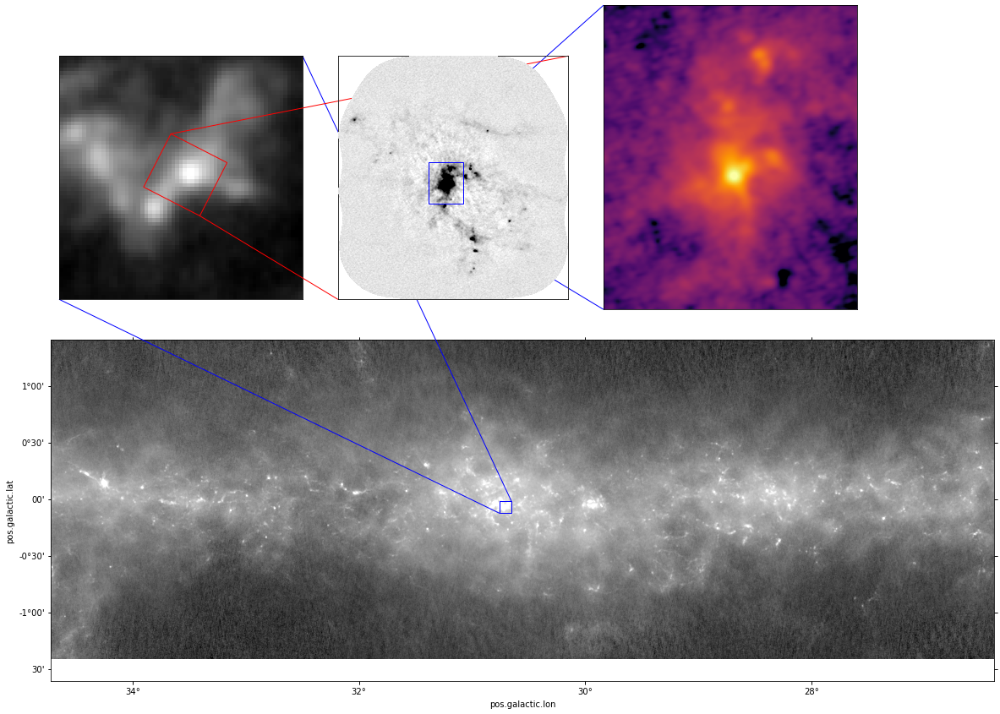

In [34]:
fig = pl.figure(1, figsize=(20,10))
fig.clf()
ax = fig.add_subplot(projection=agalwcs.celestial)
ax.imshow(agaldata,
          norm=simple_norm(agaldata, min_percent=0.1, max_percent=99.9, stretch='asinh'),
          cmap='gray',
         )

finaliter_prefix = 'W43-MM2/B6/cleanest/W43-MM2_B6_uid___A001_X1296_X113_continuum_merged_12M_robust0_selfcal5_finaliter'
image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

# # atlasgal zoom
# bl = image.wcs.celestial.pixel_to_world(-image.shape[0]*2, -image.shape[1]*2)
# tr = image.wcs.celestial.pixel_to_world(4*image.shape[0], 4*image.shape[1])
# blx, bly = map(int, agalwcs.celestial.world_to_pixel(bl))
# trx, tryy = map(int, agalwcs.celestial.world_to_pixel(tr))
# if tryy < bly:
#     bly, tryy = tryy, bly
# if trx < blx:
#     blx, trx = trx, blx

corners_world = get_corners(image.wcs.celestial, image[0])
bl, tr = corners_to_pixel_bounds(agalwcs.celestial, corners_world)
bl = list(map(int, bl))
tr = list(map(int, tr))
width = int(np.abs(bl[0]-tr[0]))
height = int(np.abs(tr[1]-bl[1]))
print(bl, tr, width, height)

blx, _ = agalwcs.celestial.world_to_pixel(corners_world[0])
slc2 = slice(bl[1]-height, tr[1]+height), slice(bl[0]-width, tr[0]+width)
axins1 = inset_axes(ax, bbox_to_anchor=[blx/5, agaldata.shape[0]/2],
                    width=4,
                    height=4,
                    axes_class=visualization.wcsaxes.core.WCSAxes,
                    axes_kwargs=dict(wcs=agalwcs.celestial[slc2]))
axins1.coords['glon'].set_ticklabel(visible=False)
axins1.coords['glat'].set_ticklabel(visible=False)
axins1.coords['glon'].set_ticks_visible(False)
axins1.coords['glat'].set_ticks_visible(False)
axins1.imshow(agaldata[slc2],
              norm=simple_norm(agaldata[slc2], min_percent=0.1, max_percent=99.9, stretch='asinh'),
              cmap='gray',
              #zorder=20,
             )
mark_inset_otherdata_full(axins1, ax, agaldata[slc2], loc1=3, loc2=1)

bl = image.wcs.celestial.pixel_to_world(0, 0)
blx, _ = agalwcs.celestial.world_to_pixel(bl)
axins = inset_axes(axins1, bbox_to_anchor=[blx/3, agaldata.shape[0]/2],
                   width=4,
                   height=4,
                   axes_class=visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image.wcs.celestial),
                  )
axins.coords['ra'].set_ticklabel(visible=False)
axins.coords['dec'].set_ticklabel(visible=False)
axins.coords['ra'].set_ticks_visible(False)
axins.coords['dec'].set_ticks_visible(False)

#axins.imshow(image[0].value)
mark_inset_generic(axins, axins1, image[0].value, loc1=1, loc2=3,
                   edgecolor='r', polyzorder=25, zorder1=1)

zp = zoom_parameters[('W43MM2', 'B6')].copy()
zp[0]['inset_pars']['bbox_to_anchor'] = [blx/3+400, agaldata.shape[0]/2+60]
zp[0]['mark_inset_pars']['loc2'] = 3
zp[0]['mark_inset_pars']['zorder'] = 30
make_zoom('W43MM2', zp, band='B6', ax=axins, fig=fig, save=False, zorder=10)
axins.set_zorder(2)
axins.set_facecolor('none')

[1122, 720] [1156, 756] 34 36
 im zorder 10
im zorder 0
p1 zorder 31
p2 zorder 31
im zorder 0
p1 zorder 31
p2 zorder 31


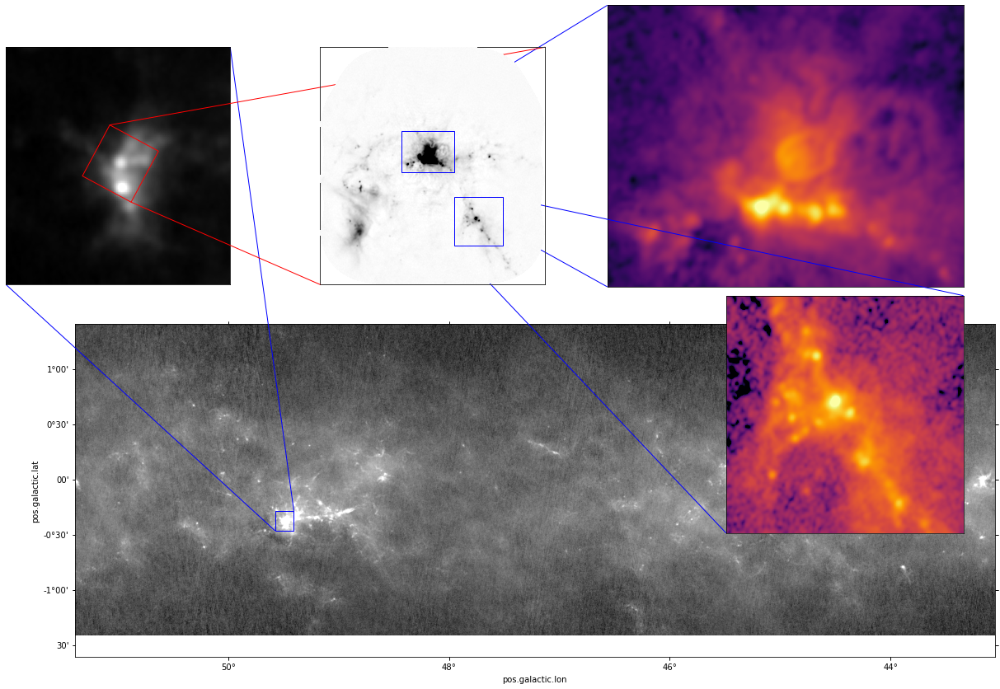

In [56]:
slc = slice(None), slice(5000, 10000)
agalwcs = WCS(atlasgal[0].header)[slc]
agaldata = atlasgal[0].data[slc]
fig = pl.figure(1, figsize=(20,10))
fig.clf()
ax = fig.add_subplot(projection=agalwcs.celestial)
ax.imshow(agaldata,
          norm=simple_norm(agaldata, min_percent=0.1, max_percent=99.9, stretch='asinh'),
          cmap='gray',
         )

field = 'W51IRS2'
finaliter_prefix = prefixes[field]['finaliter_prefix_b3']
image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

# # atlasgal zoom
# bl = image.wcs.celestial.pixel_to_world(-image.shape[0]*2, -image.shape[1]*2)
# tr = image.wcs.celestial.pixel_to_world(4*image.shape[0], 4*image.shape[1])
# blx, bly = map(int, agalwcs.celestial.world_to_pixel(bl))
# trx, tryy = map(int, agalwcs.celestial.world_to_pixel(tr))
# if tryy < bly:
#     bly, tryy = tryy, bly
# if trx < blx:
#     blx, trx = trx, blx

corners_world = get_corners(image.wcs.celestial, image[0])
bl, tr = corners_to_pixel_bounds(agalwcs.celestial, corners_world)
bl = list(map(int, bl))
tr = list(map(int, tr))
width = int(np.abs(bl[0]-tr[0]))
height = int(np.abs(tr[1]-bl[1]))
print(bl, tr, width, height)

blx, _ = agalwcs.celestial.world_to_pixel(corners_world[0])
slc2 = slice(bl[1]-height, tr[1]+height), slice(bl[0]-width, tr[0]+width)
axins1 = inset_axes(ax, bbox_to_anchor=[blx/3, agaldata.shape[0]/2],
                    width=4,
                    height=4,
                    axes_class=visualization.wcsaxes.core.WCSAxes,
                    axes_kwargs=dict(wcs=agalwcs.celestial[slc2]))
axins1.coords['glon'].set_ticklabel(visible=False)
axins1.coords['glat'].set_ticklabel(visible=False)
axins1.coords['glon'].set_ticks_visible(False)
axins1.coords['glat'].set_ticks_visible(False)
axins1.imshow(agaldata[slc2],
              norm=simple_norm(agaldata[slc2], min_percent=0.1, max_percent=99.9, stretch='asinh'),
              cmap='gray',
              #zorder=20,
             )
mark_inset_otherdata_full(axins1, ax, agaldata[slc2], loc1=3, loc2=1)

bl = image.wcs.celestial.pixel_to_world(0, 0)
blx, _ = agalwcs.celestial.world_to_pixel(bl)
axins = inset_axes(axins1, bbox_to_anchor=[blx/1.5, agaldata.shape[0]/2],
                   width=4,
                   height=4,
                   axes_class=visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image.wcs.celestial),
                  )
axins.coords['ra'].set_ticklabel(visible=False)
axins.coords['dec'].set_ticklabel(visible=False)
axins.coords['ra'].set_ticks_visible(False)
axins.coords['dec'].set_ticks_visible(False)

#axins.imshow(image[0].value)
mark_inset_generic(axins, axins1, image[0].value, loc1=1, loc2=3,
                   edgecolor='r', polyzorder=25, zorder1=1)

zp = zoom_parameters[(field, 'B6')].copy()
zp[0]['inset_pars']['bbox_to_anchor'] = [blx/1.5+500, agaldata.shape[0]/2+60]
zp[0]['mark_inset_pars']['loc2'] = 3
zp[0]['mark_inset_pars']['zorder'] = 30
zp[1]['inset_pars']['bbox_to_anchor'] = [blx/1.5+500, agaldata.shape[0]/3]
zp[1]['mark_inset_pars']['loc1'] = 1
zp[1]['mark_inset_pars']['zorder'] = 30
make_zoom(field, zp, band='B6', ax=axins, fig=fig, save=False, zorder=10)
axins.set_zorder(2)
axins.set_facecolor('none')

[2391, 900] [2412, 921] 21 21
 im zorder 10
im zorder 0
p1 zorder 31
p2 zorder 31


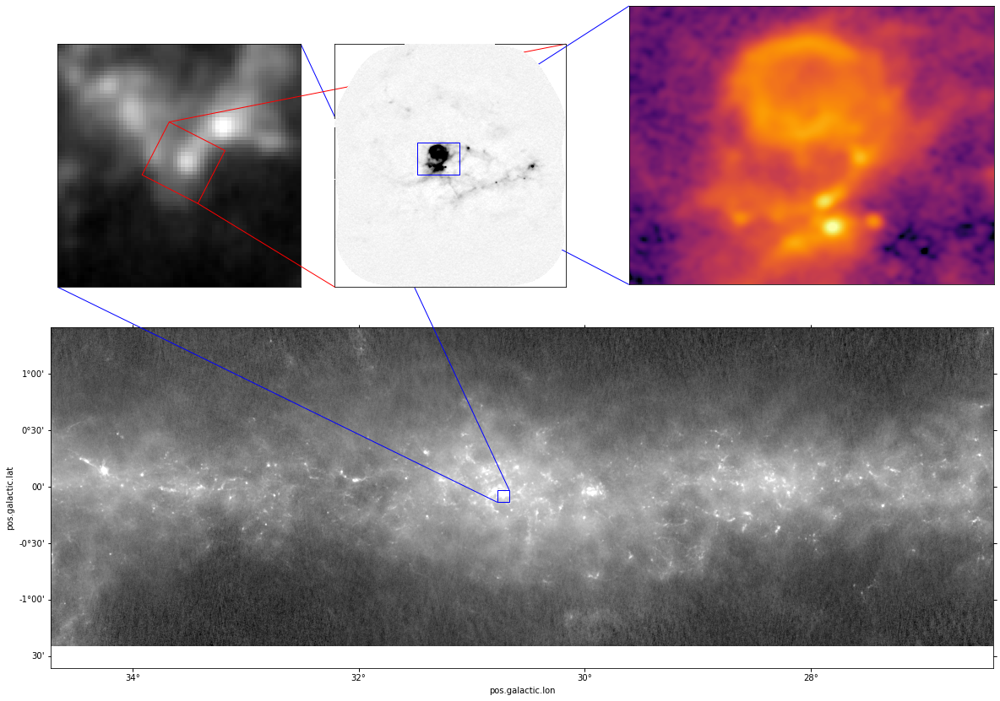

In [40]:
slc = slice(None), slice(15000, 20000)
agalwcs = WCS(atlasgal[0].header)[slc]
agaldata = atlasgal[0].data[slc]
fig = pl.figure(1, figsize=(20,10))
fig.clf()
ax = fig.add_subplot(projection=agalwcs.celestial)
ax.imshow(agaldata,
          norm=simple_norm(agaldata, min_percent=0.1, max_percent=99.9, stretch='asinh'),
          cmap='gray',
         )

field = 'W43MM3'
finaliter_prefix = prefixes[field]['finaliter_prefix_b6']
image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

# # atlasgal zoom
# bl = image.wcs.celestial.pixel_to_world(-image.shape[0]*2, -image.shape[1]*2)
# tr = image.wcs.celestial.pixel_to_world(4*image.shape[0], 4*image.shape[1])
# blx, bly = map(int, agalwcs.celestial.world_to_pixel(bl))
# trx, tryy = map(int, agalwcs.celestial.world_to_pixel(tr))
# if tryy < bly:
#     bly, tryy = tryy, bly
# if trx < blx:
#     blx, trx = trx, blx

corners_world = get_corners(image.wcs.celestial, image[0])
bl, tr = corners_to_pixel_bounds(agalwcs.celestial, corners_world)
bl = list(map(int, bl))
tr = list(map(int, tr))
width = int(np.abs(bl[0]-tr[0]))
height = int(np.abs(tr[1]-bl[1]))
print(bl, tr, width, height)

blx, _ = agalwcs.celestial.world_to_pixel(corners_world[0])
slc2 = slice(bl[1]-height, tr[1]+height), slice(bl[0]-width, tr[0]+width)
axins1 = inset_axes(ax, bbox_to_anchor=[blx/5, agaldata.shape[0]/2],
                    width=4,
                    height=4,
                    axes_class=visualization.wcsaxes.core.WCSAxes,
                    axes_kwargs=dict(wcs=agalwcs.celestial[slc2]))
axins1.coords['glon'].set_ticklabel(visible=False)
axins1.coords['glat'].set_ticklabel(visible=False)
axins1.coords['glon'].set_ticks_visible(False)
axins1.coords['glat'].set_ticks_visible(False)
axins1.imshow(agaldata[slc2],
              norm=simple_norm(agaldata[slc2], min_percent=0.1, max_percent=99.9, stretch='asinh'),
              cmap='gray',
              #zorder=20,
             )
mark_inset_otherdata_full(axins1, ax, agaldata[slc2], loc1=3, loc2=1)

bl = image.wcs.celestial.pixel_to_world(0, 0)
blx, _ = agalwcs.celestial.world_to_pixel(bl)
axins = inset_axes(axins1, bbox_to_anchor=[blx/3, agaldata.shape[0]/2],
                   width=4,
                   height=4,
                   axes_class=visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image.wcs.celestial),
                  )
axins.coords['ra'].set_ticklabel(visible=False)
axins.coords['dec'].set_ticklabel(visible=False)
axins.coords['ra'].set_ticks_visible(False)
axins.coords['dec'].set_ticks_visible(False)

#axins.imshow(image[0].value)
mark_inset_generic(axins, axins1, image[0].value, loc1=1, loc2=3,
                   edgecolor='r', polyzorder=25, zorder1=1)

zp = zoom_parameters[(field, 'B6')].copy()
zp[0]['inset_pars']['bbox_to_anchor'] = [blx/3+500, agaldata.shape[0]/2+60]
zp[0]['mark_inset_pars']['loc2'] = 3
zp[0]['mark_inset_pars']['zorder'] = 30
make_zoom(field, zp, band='B6', ax=axins, fig=fig, save=False, zorder=10)
axins.set_zorder(2)
axins.set_facecolor('none')

In [58]:
prefixes.keys()

dict_keys(['G328', 'G333', 'G12', 'W51IRS2', 'G008', 'G327', 'G10', 'G337', 'G338', 'G351', 'G353', 'W43MM3', 'W43MM2', 'W43MM1', 'W51-E'])

[1122, 708] [1156, 744] 34 36
 im zorder 10
im zorder 0
p1 zorder 31
p2 zorder 31


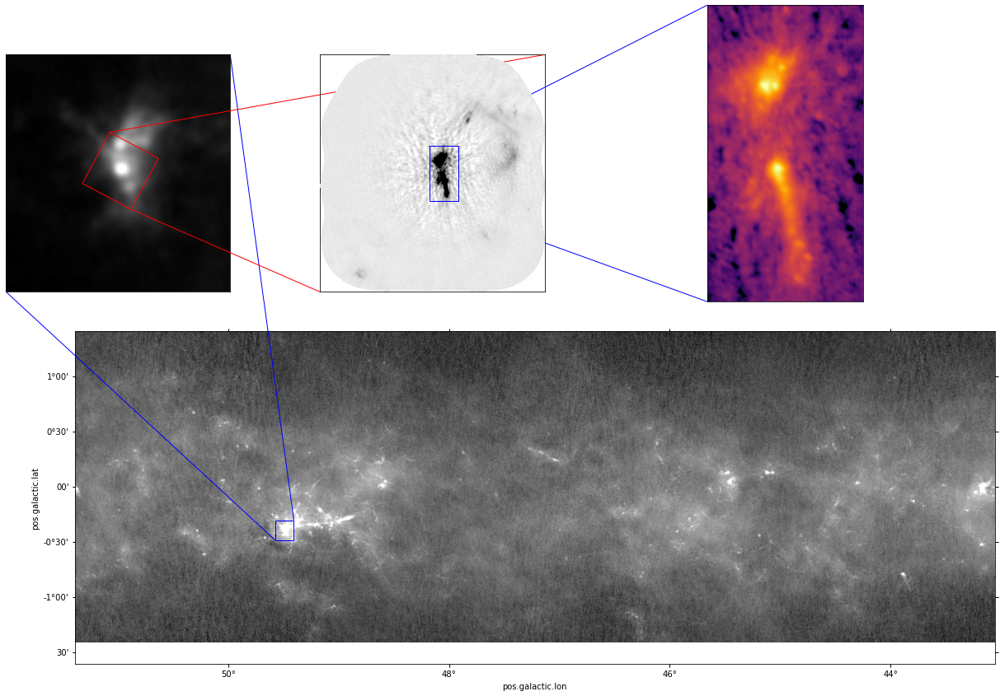

In [60]:
slc = slice(None), slice(5000, 10000)
agalwcs = WCS(atlasgal[0].header)[slc]
agaldata = atlasgal[0].data[slc]
fig = pl.figure(1, figsize=(20,10))
fig.clf()
ax = fig.add_subplot(projection=agalwcs.celestial)
ax.imshow(agaldata,
          norm=simple_norm(agaldata, min_percent=0.1, max_percent=99.9, stretch='asinh'),
          cmap='gray',
         )

field = 'W51-E'
finaliter_prefix = prefixes[field]['finaliter_prefix_b3']
image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

# # atlasgal zoom
# bl = image.wcs.celestial.pixel_to_world(-image.shape[0]*2, -image.shape[1]*2)
# tr = image.wcs.celestial.pixel_to_world(4*image.shape[0], 4*image.shape[1])
# blx, bly = map(int, agalwcs.celestial.world_to_pixel(bl))
# trx, tryy = map(int, agalwcs.celestial.world_to_pixel(tr))
# if tryy < bly:
#     bly, tryy = tryy, bly
# if trx < blx:
#     blx, trx = trx, blx

corners_world = get_corners(image.wcs.celestial, image[0])
bl, tr = corners_to_pixel_bounds(agalwcs.celestial, corners_world)
bl = list(map(int, bl))
tr = list(map(int, tr))
width = int(np.abs(bl[0]-tr[0]))
height = int(np.abs(tr[1]-bl[1]))
print(bl, tr, width, height)

blx, _ = agalwcs.celestial.world_to_pixel(corners_world[0])
slc2 = slice(bl[1]-height, tr[1]+height), slice(bl[0]-width, tr[0]+width)
axins1 = inset_axes(ax, bbox_to_anchor=[blx/3, agaldata.shape[0]/2],
                    width=4,
                    height=4,
                    axes_class=visualization.wcsaxes.core.WCSAxes,
                    axes_kwargs=dict(wcs=agalwcs.celestial[slc2]))
axins1.coords['glon'].set_ticklabel(visible=False)
axins1.coords['glat'].set_ticklabel(visible=False)
axins1.coords['glon'].set_ticks_visible(False)
axins1.coords['glat'].set_ticks_visible(False)
axins1.imshow(agaldata[slc2],
              norm=simple_norm(agaldata[slc2], min_percent=0.1, max_percent=99.9, stretch='asinh'),
              cmap='gray',
              #zorder=20,
             )
mark_inset_otherdata_full(axins1, ax, agaldata[slc2], loc1=3, loc2=1)

bl = image.wcs.celestial.pixel_to_world(0, 0)
blx, _ = agalwcs.celestial.world_to_pixel(bl)
axins = inset_axes(axins1, bbox_to_anchor=[blx/1.5, agaldata.shape[0]/2],
                   width=4,
                   height=4,
                   axes_class=visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image.wcs.celestial),
                  )
axins.coords['ra'].set_ticklabel(visible=False)
axins.coords['dec'].set_ticklabel(visible=False)
axins.coords['ra'].set_ticks_visible(False)
axins.coords['dec'].set_ticks_visible(False)

#axins.imshow(image[0].value)
mark_inset_generic(axins, axins1, image[0].value, loc1=1, loc2=3,
                   edgecolor='r', polyzorder=25, zorder1=1)

zp = zoom_parameters[(field, 'B6')].copy()
zp[0]['inset_pars']['bbox_to_anchor'] = [blx/1.5+500, agaldata.shape[0]/2+60]
zp[0]['mark_inset_pars']['loc2'] = 3
zp[0]['mark_inset_pars']['zorder'] = 30
#zp[1]['inset_pars']['bbox_to_anchor'] = [blx/1.5+500, agaldata.shape[0]/3]
#zp[1]['mark_inset_pars']['loc1'] = 1
#zp[1]['mark_inset_pars']['zorder'] = 30
make_zoom(field, zp, band='B6', ax=axins, fig=fig, save=False, zorder=10)
axins.set_zorder(2)
axins.set_facecolor('none')

[2613, 729] [2640, 757] 27 28
 im zorder 10


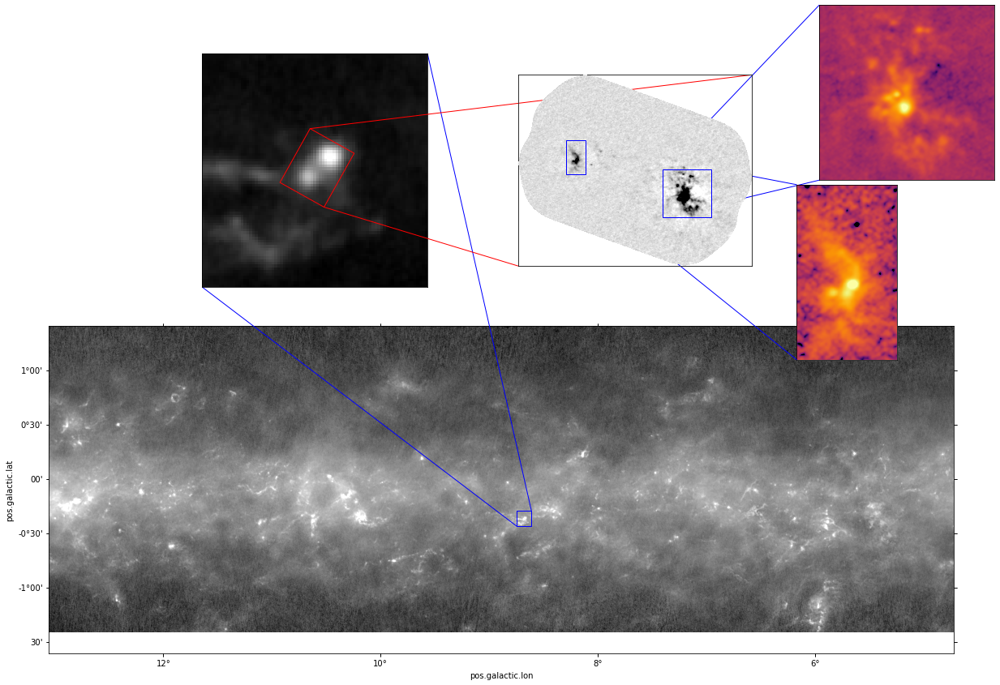

In [85]:
slc = slice(None), slice(28000, 33000)
agalwcs = WCS(atlasgal[0].header)[slc]
agaldata = atlasgal[0].data[slc]
fig = pl.figure(1, figsize=(20,10))
fig.clf()
ax = fig.add_subplot(projection=agalwcs.celestial)
ax.imshow(agaldata,
          norm=simple_norm(agaldata, min_percent=0.1, max_percent=99.9, stretch='asinh'),
          cmap='gray',
         )

field = 'G008'
finaliter_prefix = prefixes[field]['finaliter_prefix_b6']
image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

# # atlasgal zoom
# bl = image.wcs.celestial.pixel_to_world(-image.shape[0]*2, -image.shape[1]*2)
# tr = image.wcs.celestial.pixel_to_world(4*image.shape[0], 4*image.shape[1])
# blx, bly = map(int, agalwcs.celestial.world_to_pixel(bl))
# trx, tryy = map(int, agalwcs.celestial.world_to_pixel(tr))
# if tryy < bly:
#     bly, tryy = tryy, bly
# if trx < blx:
#     blx, trx = trx, blx

corners_world = get_corners(image.wcs.celestial, image[0])
bl, tr = corners_to_pixel_bounds(agalwcs.celestial, corners_world)
bl = list(map(int, bl))
tr = list(map(int, tr))
width = int(np.abs(bl[0]-tr[0]))
height = int(np.abs(tr[1]-bl[1]))
print(bl, tr, width, height)

blx, _ = agalwcs.celestial.world_to_pixel(corners_world[0])
slc2 = slice(bl[1]-height, tr[1]+height), slice(bl[0]-width, tr[0]+width)
axins1 = inset_axes(ax, bbox_to_anchor=[blx/4, agaldata.shape[0]/2],
                    width=4,
                    height=4,
                    axes_class=visualization.wcsaxes.core.WCSAxes,
                    axes_kwargs=dict(wcs=agalwcs.celestial[slc2]))
axins1.coords['glon'].set_ticklabel(visible=False)
axins1.coords['glat'].set_ticklabel(visible=False)
axins1.coords['glon'].set_ticks_visible(False)
axins1.coords['glat'].set_ticks_visible(False)
axins1.imshow(agaldata[slc2],
              norm=simple_norm(agaldata[slc2], min_percent=0.1, max_percent=99.9, stretch='asinh'),
              cmap='gray',
              #zorder=20,
             )
mark_inset_otherdata_full(axins1, ax, agaldata[slc2], loc1=3, loc2=1)

bl = image.wcs.celestial.pixel_to_world(0, 0)
blx, _ = agalwcs.celestial.world_to_pixel(bl)
axins = inset_axes(axins1, bbox_to_anchor=[blx/2.5, agaldata.shape[0]/2],
                   width=4,
                   height=4,
                   axes_class=visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image.wcs.celestial),
                  )
axins.coords['ra'].set_ticklabel(visible=False)
axins.coords['dec'].set_ticklabel(visible=False)
axins.coords['ra'].set_ticks_visible(False)
axins.coords['dec'].set_ticks_visible(False)

#axins.imshow(image[0].value)
mark_inset_generic(axins, axins1, image[0].value, loc1=1, loc2=3,
                   edgecolor='r', polyzorder=25, zorder1=1)

zp = zoom_parameters[(field, 'B6')].copy()
zp[0]['inset_pars']['bbox_to_anchor'] = [blx/3.5+600, agaldata.shape[0]/2+60]
zp[0]['mark_inset_pars']['loc2'] = 3
zp[0]['mark_inset_pars']['zorder'] = 30
zp[1]['inset_pars']['bbox_to_anchor'] = [blx/3.5+300, agaldata.shape[0]/3.5]
zp[1]['mark_inset_pars']['loc1'] = 2
zp[1]['mark_inset_pars']['loc2'] = 3
zp[1]['mark_inset_pars']['zorder'] = 30
make_zoom(field, zp, band='B6', ax=axins, fig=fig, save=False, zorder=10)
axins.set_zorder(2)
axins.set_facecolor('none')

[1447, 718] [1469, 740] 22 22
 im zorder 10


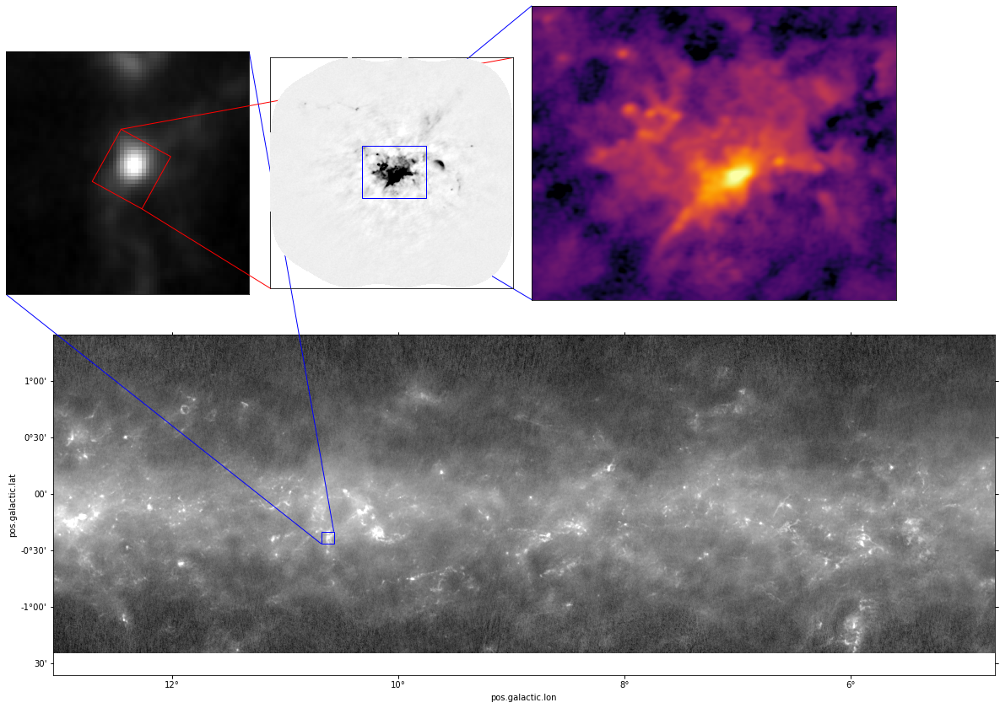

In [84]:
slc = slice(None), slice(28000, 33000)
agalwcs = WCS(atlasgal[0].header)[slc]
agaldata = atlasgal[0].data[slc]
fig = pl.figure(1, figsize=(20,10))
fig.clf()
ax = fig.add_subplot(projection=agalwcs.celestial)
ax.imshow(agaldata,
          norm=simple_norm(agaldata, min_percent=0.1, max_percent=99.9, stretch='asinh'),
          cmap='gray',
         )

field = 'G10'
finaliter_prefix = prefixes[field]['finaliter_prefix_b6']
image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

# # atlasgal zoom
# bl = image.wcs.celestial.pixel_to_world(-image.shape[0]*2, -image.shape[1]*2)
# tr = image.wcs.celestial.pixel_to_world(4*image.shape[0], 4*image.shape[1])
# blx, bly = map(int, agalwcs.celestial.world_to_pixel(bl))
# trx, tryy = map(int, agalwcs.celestial.world_to_pixel(tr))
# if tryy < bly:
#     bly, tryy = tryy, bly
# if trx < blx:
#     blx, trx = trx, blx

corners_world = get_corners(image.wcs.celestial, image[0])
bl, tr = corners_to_pixel_bounds(agalwcs.celestial, corners_world)
bl = list(map(int, bl))
tr = list(map(int, tr))
width = int(np.abs(bl[0]-tr[0]))
height = int(np.abs(tr[1]-bl[1]))
print(bl, tr, width, height)

blx, _ = agalwcs.celestial.world_to_pixel(corners_world[0])
slc2 = slice(bl[1]-height, tr[1]+height), slice(bl[0]-width, tr[0]+width)
axins1 = inset_axes(ax, bbox_to_anchor=[blx/3.5, agaldata.shape[0]/2],
                    width=4,
                    height=4,
                    axes_class=visualization.wcsaxes.core.WCSAxes,
                    axes_kwargs=dict(wcs=agalwcs.celestial[slc2]))
axins1.coords['glon'].set_ticklabel(visible=False)
axins1.coords['glat'].set_ticklabel(visible=False)
axins1.coords['glon'].set_ticks_visible(False)
axins1.coords['glat'].set_ticks_visible(False)
axins1.imshow(agaldata[slc2],
              norm=simple_norm(agaldata[slc2], min_percent=0.1, max_percent=99.9, stretch='asinh'),
              cmap='gray',
              #zorder=20,
             )
mark_inset_otherdata_full(axins1, ax, agaldata[slc2], loc1=3, loc2=1)

bl = image.wcs.celestial.pixel_to_world(0, 0)
blx, _ = agalwcs.celestial.world_to_pixel(bl)
axins = inset_axes(axins1, bbox_to_anchor=[blx/2, agaldata.shape[0]/2],
                   width=4,
                   height=4,
                   axes_class=visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image.wcs.celestial),
                  )
axins.coords['ra'].set_ticklabel(visible=False)
axins.coords['dec'].set_ticklabel(visible=False)
axins.coords['ra'].set_ticks_visible(False)
axins.coords['dec'].set_ticks_visible(False)

#axins.imshow(image[0].value)
mark_inset_generic(axins, axins1, image[0].value, loc1=1, loc2=3,
                   edgecolor='r', polyzorder=25, zorder1=1)

zp = zoom_parameters[(field, 'B6')].copy()
zp[0]['inset_pars']['bbox_to_anchor'] = [blx/2.5+600, agaldata.shape[0]/2+60]
zp[0]['mark_inset_pars']['loc2'] = 3
zp[0]['mark_inset_pars']['zorder'] = 30
#zp[1]['inset_pars']['bbox_to_anchor'] = [blx/3.5+300, agaldata.shape[0]/3.5]
#zp[1]['mark_inset_pars']['loc1'] = 2
#zp[1]['mark_inset_pars']['loc2'] = 3
#zp[1]['mark_inset_pars']['zorder'] = 30
make_zoom(field, zp, band='B6', ax=axins, fig=fig, save=False, zorder=10)
axins.set_zorder(2)
axins.set_facecolor('none')

[135, 825] [165, 855] 30 30
 im zorder 10


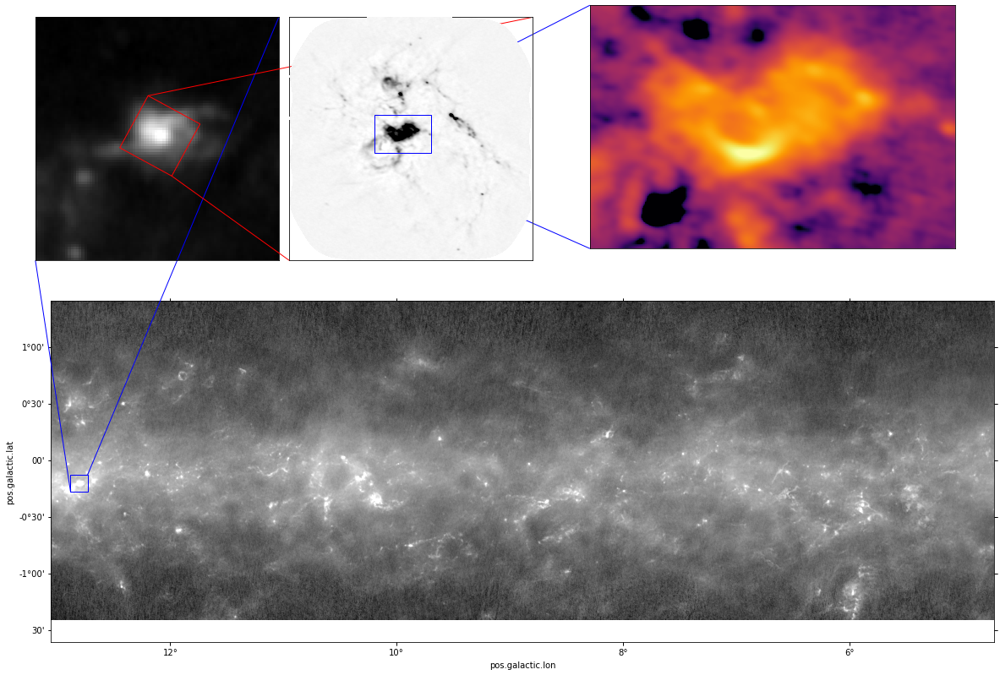

In [83]:
slc = slice(None), slice(28000, 33000)
agalwcs = WCS(atlasgal[0].header)[slc]
agaldata = atlasgal[0].data[slc]
fig = pl.figure(1, figsize=(20,10))
fig.clf()
ax = fig.add_subplot(projection=agalwcs.celestial)
ax.imshow(agaldata,
          norm=simple_norm(agaldata, min_percent=0.1, max_percent=99.9, stretch='asinh'),
          cmap='gray',
         )

field = 'G12'
finaliter_prefix = prefixes[field]['finaliter_prefix_b6']
image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

# # atlasgal zoom
# bl = image.wcs.celestial.pixel_to_world(-image.shape[0]*2, -image.shape[1]*2)
# tr = image.wcs.celestial.pixel_to_world(4*image.shape[0], 4*image.shape[1])
# blx, bly = map(int, agalwcs.celestial.world_to_pixel(bl))
# trx, tryy = map(int, agalwcs.celestial.world_to_pixel(tr))
# if tryy < bly:
#     bly, tryy = tryy, bly
# if trx < blx:
#     blx, trx = trx, blx

corners_world = get_corners(image.wcs.celestial, image[0])
bl, tr = corners_to_pixel_bounds(agalwcs.celestial, corners_world)
bl = list(map(int, bl))
tr = list(map(int, tr))
width = int(np.abs(bl[0]-tr[0]))
height = int(np.abs(tr[1]-bl[1]))
print(bl, tr, width, height)

blx, _ = agalwcs.celestial.world_to_pixel(corners_world[0])
slc2 = slice(bl[1]-height, tr[1]+height), slice(bl[0]-width, tr[0]+width)
axins1 = inset_axes(ax, bbox_to_anchor=[blx+300, agaldata.shape[0]/2],
                    width=4,
                    height=4,
                    axes_class=visualization.wcsaxes.core.WCSAxes,
                    axes_kwargs=dict(wcs=agalwcs.celestial[slc2]))
axins1.coords['glon'].set_ticklabel(visible=False)
axins1.coords['glat'].set_ticklabel(visible=False)
axins1.coords['glon'].set_ticks_visible(False)
axins1.coords['glat'].set_ticks_visible(False)
axins1.imshow(agaldata[slc2],
              norm=simple_norm(agaldata[slc2], min_percent=0.1, max_percent=99.9, stretch='asinh'),
              cmap='gray',
              #zorder=20,
             )
mark_inset_otherdata_full(axins1, ax, agaldata[slc2], loc1=3, loc2=1)

bl = image.wcs.celestial.pixel_to_world(0, 0)
blx, _ = agalwcs.celestial.world_to_pixel(bl)
axins = inset_axes(axins1, bbox_to_anchor=[blx + 600, agaldata.shape[0]/2],
                   width=4,
                   height=4,
                   axes_class=visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image.wcs.celestial),
                  )
axins.coords['ra'].set_ticklabel(visible=False)
axins.coords['dec'].set_ticklabel(visible=False)
axins.coords['ra'].set_ticks_visible(False)
axins.coords['dec'].set_ticks_visible(False)

#axins.imshow(image[0].value)
mark_inset_generic(axins, axins1, image[0].value, loc1=1, loc2=3,
                   edgecolor='r', polyzorder=25, zorder1=1)

zp = zoom_parameters[(field, 'B6')].copy()
zp[0]['inset_pars']['bbox_to_anchor'] = [blx+1100, agaldata.shape[0]/2+50]
zp[0]['mark_inset_pars']['loc2'] = 3
zp[0]['mark_inset_pars']['zorder'] = 30
#zp[1]['inset_pars']['bbox_to_anchor'] = [blx/3.5+300, agaldata.shape[0]/3.5]
#zp[1]['mark_inset_pars']['loc1'] = 2
#zp[1]['mark_inset_pars']['loc2'] = 3
#zp[1]['mark_inset_pars']['zorder'] = 30
make_zoom(field, zp, band='B6', ax=axins, fig=fig, save=False, zorder=10)
axins.set_zorder(2)
axins.set_facecolor('none')

In [70]:
prefixes.keys()

dict_keys(['G328', 'G333', 'G12', 'W51IRS2', 'G008', 'G327', 'G10', 'G337', 'G338', 'G351', 'G353', 'W43MM3', 'W43MM2', 'W43MM1', 'W51-E'])